In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.spatial.distance import cdist
from photutils.aperture import CircularAperture, CircularAnnulus, EllipticalAperture, EllipticalAnnulus, RectangularAperture, RectangularAnnulus
from photutils.aperture import ApertureStats, aperture_photometry
from photutils.detection import DAOStarFinder, find_peaks
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.table import Table
from astropy.coordinates import Angle
import sys

sys.path.append('/home/finn/visual_Studio_Code/bachelorarbeit/')
from plotting import show_image
from phot_used_functions import filter_sources, determine_distance, determine_shift, determine_fwhm

In [2]:
'''
path= '/home/finn/visual_Studio_Code/data/2023-10-01/stacked/lightCor_HIP75458_mesh_R (Johnson)_1.5s_mesh_10_images_stacked_'

image_list = []
titles = []
for fits_path in glob.glob(os.path.join(path + '*fit')):
    with fits.open(fits_path) as hdul:
        image_list.append(hdul[0].data)
        exptime = hdul[0].header["EXPTIME"]
        titles.append(hdul[0].header['DATE-OBS'][:10] + os.path.splitext(os.path.basename(fits_path))[0][8:]) #date + filename

print("number of images:",len(image_list))
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
show_image(image_list[0], fig=fig, ax=ax)
ax.set_title(titles[0])
 '''

'\npath= \'/home/finn/visual_Studio_Code/data/2023-10-01/stacked/lightCor_HIP75458_mesh_R (Johnson)_1.5s_mesh_10_images_stacked_\'\n\nimage_list = []\ntitles = []\nfor fits_path in glob.glob(os.path.join(path + \'*fit\')):\n    with fits.open(fits_path) as hdul:\n        image_list.append(hdul[0].data)\n        exptime = hdul[0].header["EXPTIME"]\n        titles.append(hdul[0].header[\'DATE-OBS\'][:10] + os.path.splitext(os.path.basename(fits_path))[0][8:]) #date + filename\n\nprint("number of images:",len(image_list))\nfig, ax = plt.subplots(1, 1, figsize=(10, 10))\nshow_image(image_list[0], fig=fig, ax=ax)\nax.set_title(titles[0])\n '

number of images: 5


Text(0.5, 1.0, '2023-10-01_HIP75458_mesh_B (Johnson)_7.5s_10_images_stacked_0')

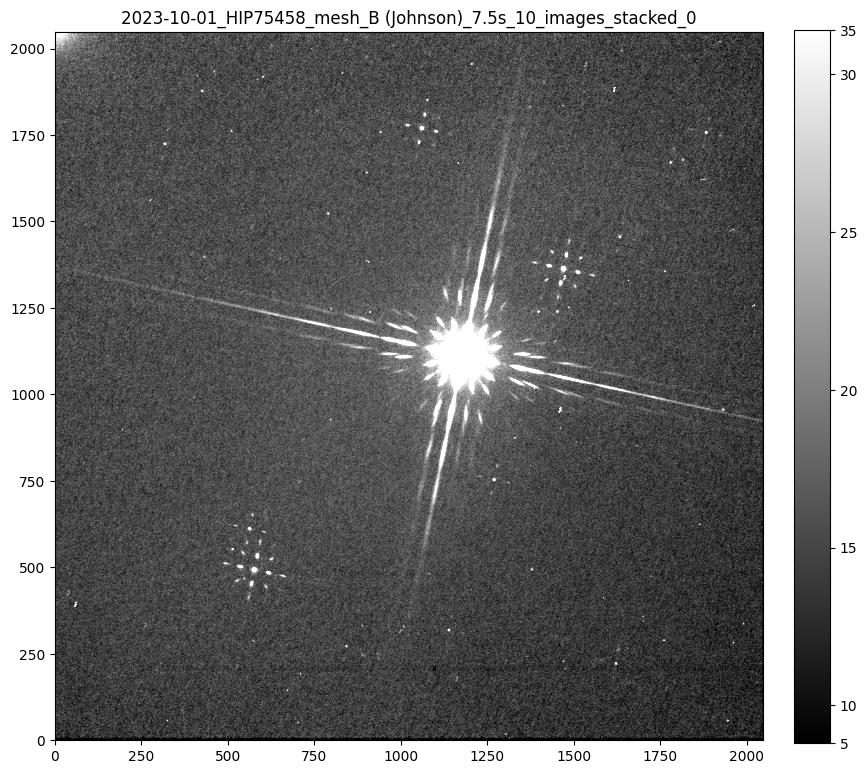

In [3]:

path = '/home/finn/visual_Studio_Code/data/2023-10-01/stacked/lightCor_HIP75458_mesh_B (Johnson)_7.5s_10_images_stacked_'

# Function to extract the number from the filename
get_number_from_filename = lambda fits_path: int(os.path.splitext(os.path.basename(fits_path))[0].split('_')[-1])
fits_files = glob.glob(os.path.join(path + '*fit'))
fits_files = sorted(fits_files, key=get_number_from_filename)
image_list = []
titles = []

for fits_path in fits_files:
    hdul = fits.open(fits_path)
    image_list.append(hdul[0].data)
    exptime = hdul[0].header["EXPTIME"]
    titles.append(hdul[0].header['DATE-OBS'][:10] + os.path.splitext(os.path.basename(fits_path))[0][8:])  # date + filename
    hdul.close()

print("number of images:", len(image_list))
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
show_image(image_list[0], fig=fig, ax=ax)
ax.set_title(titles[0])

In [4]:
shifts = determine_shift(image_list, wanted_index=0)
print(shifts)

Number of images to process: 5
we use image:  0 from given list as reference image


[(0, 0), (0.84242034, 10.908382), (4.186239, 24.129093), (-4.6336346, 6.298773), (-21.480316, -5.5565987)]


[array([1043, 1024]), array([1086, 1246]), array([1314, 1197]), array([1270,  973]), array([1047, 1079]), array([1070, 1194]), array([1141, 1236]), array([1258, 1211]), array([1307, 1141]), array([1283, 1028]), array([1214,  985]), array([1096, 1010])]
[array([1043.84242034, 1034.90838242]), array([1086.84242034, 1256.90838242]), array([1314.84242034, 1207.90838242]), array([1270.84242034,  983.90838242]), array([1047.84242034, 1089.90838242]), array([1070.84242034, 1204.90838242]), array([1141.84242034, 1246.90838242]), array([1258.84242034, 1221.90838242]), array([1307.84242034, 1151.90838242]), array([1283.84242034, 1038.90838242]), array([1214.84242034,  995.90838242]), array([1096.84242034, 1020.90838242])]
[array([1047.18623877, 1048.12909317]), array([1090.18623877, 1270.12909317]), array([1318.18623877, 1221.12909317]), array([1274.18623877,  997.12909317]), array([1051.18623877, 1103.12909317]), array([1074.18623877, 1218.12909317]), array([1145.18623877, 1260.12909317]), arra

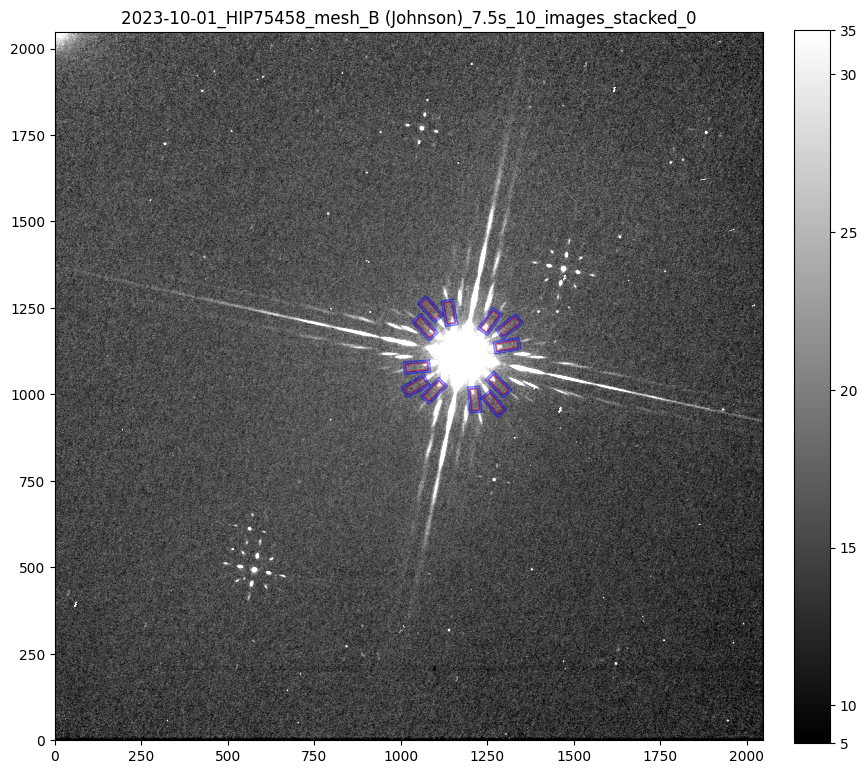

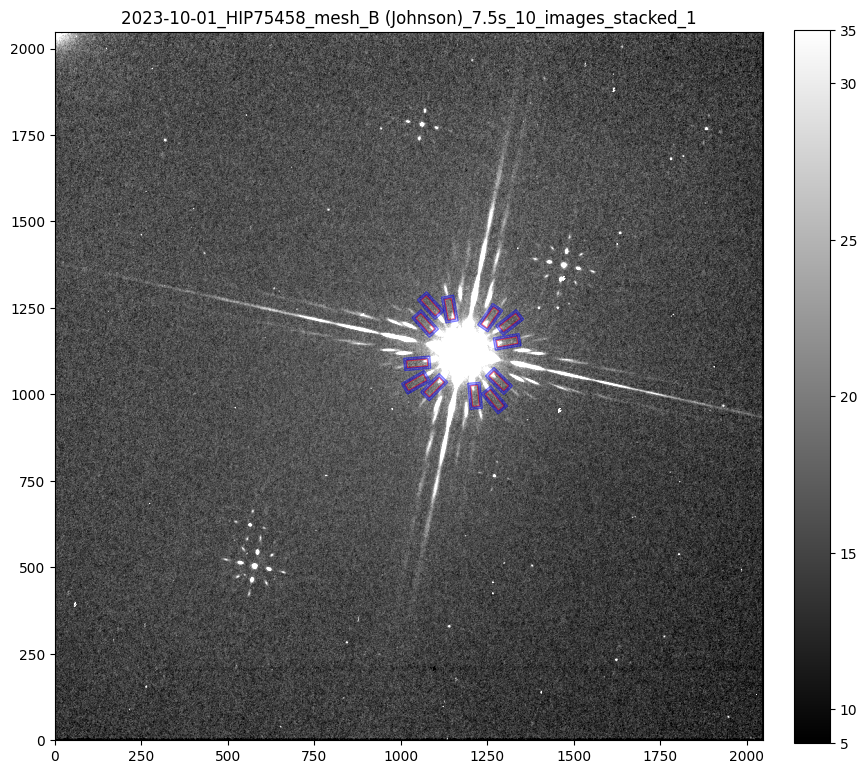

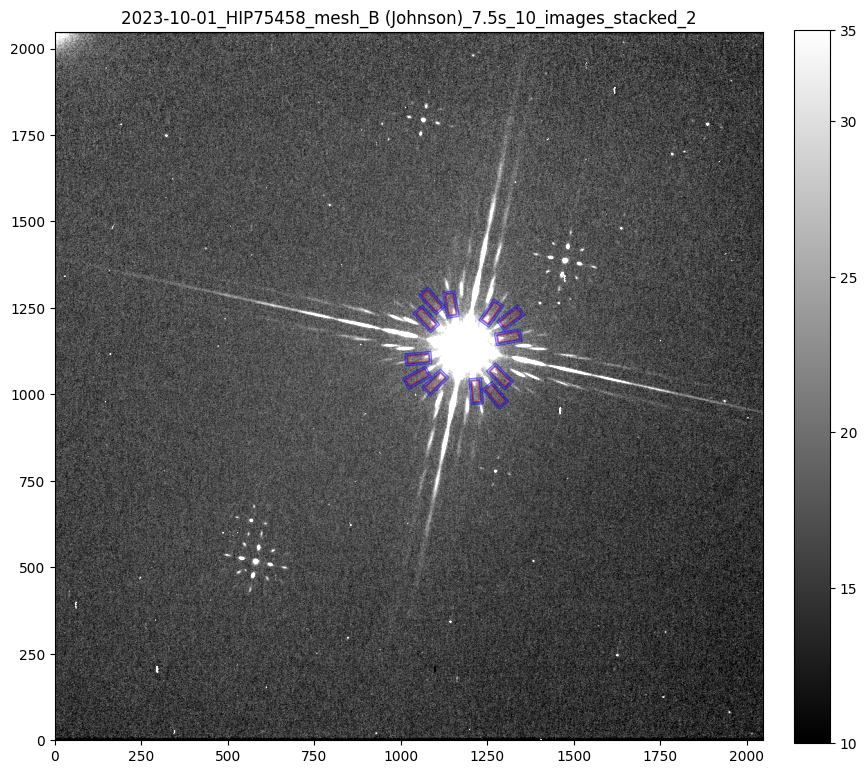

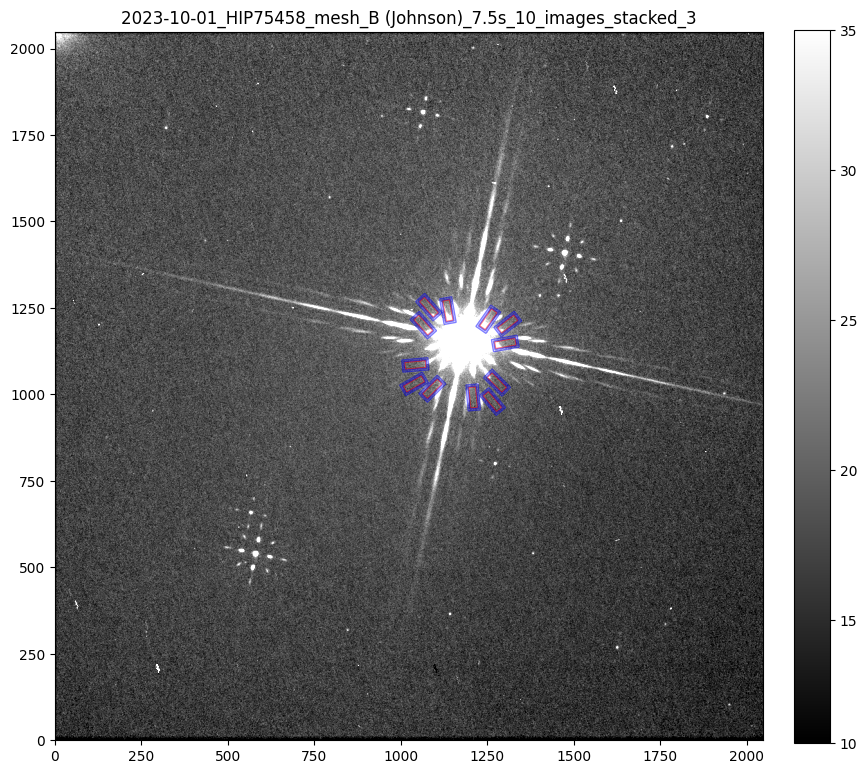

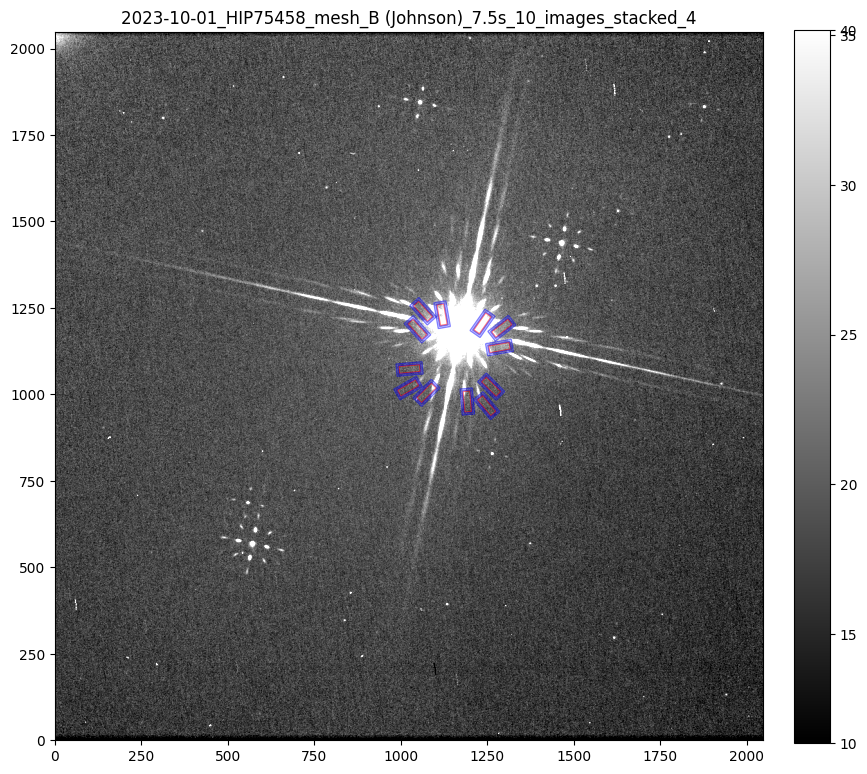

In [5]:
# use clicker 
# define positon per hand from bottom left to ul, ur, br, then spikes next to corners, starting from above bl
bright_positions= [(1043, 1024), (1086, 1246), (1314, 1197), (1270, 973),
                  (1047, 1079), (1070, 1194), (1141, 1236), (1258, 1211), (1307, 1141), (1283, 1028), (1214, 985), (1096, 1010)]
theta_list = [Angle(angle, 'deg') for angle in [30, 132, 38, 310, 5, 132, 100, 55, 10, 135, 95, 45]] #define rotation for each corner (rotation is from righ to top = 90)

edge_list = [[15,1398],[1366, 2042],[2045,951], [950,10]] # from left to up,r,b:  important for faint stars
w, h = 60.0, 20.0 #width of box (x) and hight of box (y)

magnitude_list_bright = []

for i,image in enumerate (image_list):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    show_image(image, fig=fig, ax=ax)
    ax.set_title(titles[i])
    shifted_positions = []
    for position in bright_positions:
        tuple = np.array((position[0]+shifts[i][0], position[1]+shifts[i][1]))
        #tuple = np.array((position[0], position[1]))
        shifted_positions.append(tuple)
    print(shifted_positions)
    apertures_bright = [RectangularAperture(position, w=w, h=h, theta=theta) for position, theta in zip(shifted_positions, theta_list)]
    annuluses_bright = [RectangularAnnulus(position, w_in=w+5, w_out=w+15, h_in=h+5, h_out=h+15, theta=theta) for position, theta in zip(shifted_positions, theta_list)]
    for aperture in apertures_bright:
        aperture.plot(color="red", lw=1.0, alpha=0.5)
    for anulus in annuluses_bright:
        anulus.plot(color="blue", lw=1.0, alpha=0.5)

    phot_table_bright = Table(names=('id', 'xcenter', 'ycenter', 'aperture_sum', 'total_bkg'), dtype=('int', 'float', 'float', 'float', 'float'))
    for i in range(len(apertures_bright)):
        aperstats = ApertureStats(image, annuluses_bright[i])
        bkg = aperstats.median
        aperture_area = apertures_bright[i].area_overlap(image)
        total_bkg = bkg * aperture_area
        phot_table = aperture_photometry(image, apertures_bright[i])
        phot_table['total_bkg'] = total_bkg
        phot_table_bright.add_row([i, phot_table['xcenter'][0], phot_table['ycenter'][0], phot_table['aperture_sum'][0], phot_table['total_bkg'][0]])

    magnitudes=[]
    for row in phot_table_bright:
        magnitude =  - (2.5 * np.log10(abs(row['aperture_sum'] - row['total_bkg']) / exptime))
        magnitudes.append(magnitude)
    magnitude_list_bright.append(magnitudes)
    phot_table_bright['magnitude'] = magnitudes
    #phot_table_bright['magnitude'] = magnitude_bright
    #phot_table_bright.pprint(max_lines = -1, max_width = -1)
mean_magnitude_list_bright = [np.mean(mag) for mag in magnitude_list_bright]
print(mean_magnitude_list_bright)
print(np.mean(mean_magnitude_list_bright),"+-", np.std(mean_magnitude_list_bright))


unfiltered #stars: 41
detected stars in focused image: 27
[-8.126202178600389, -8.074687600299487, -8.124305872592014, -8.05096720584732, -8.06598054732529]
-8.0884286809329 +- 0.03101647343721461


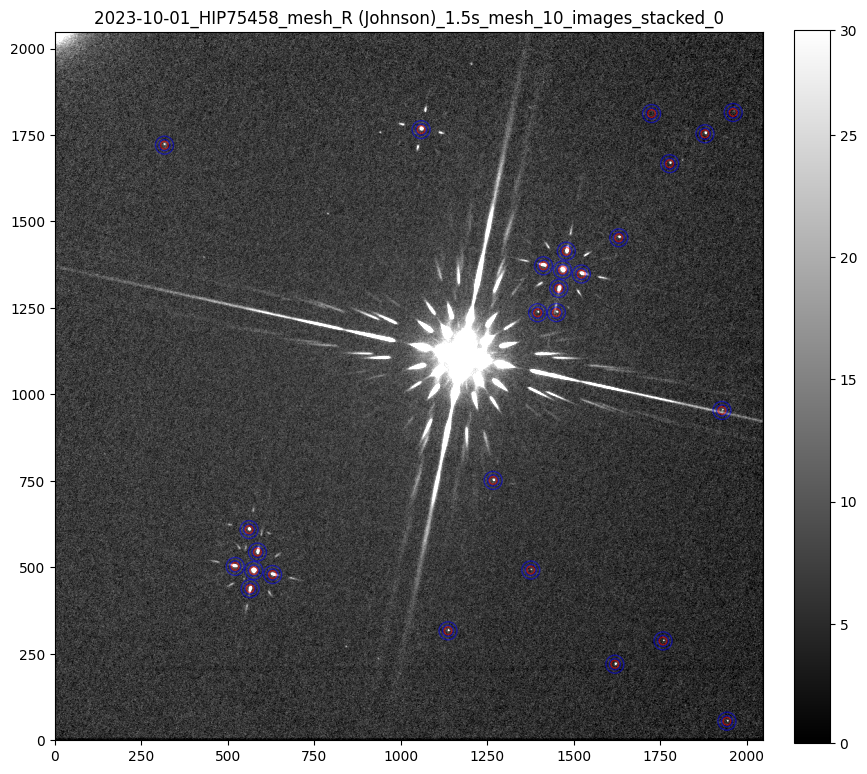

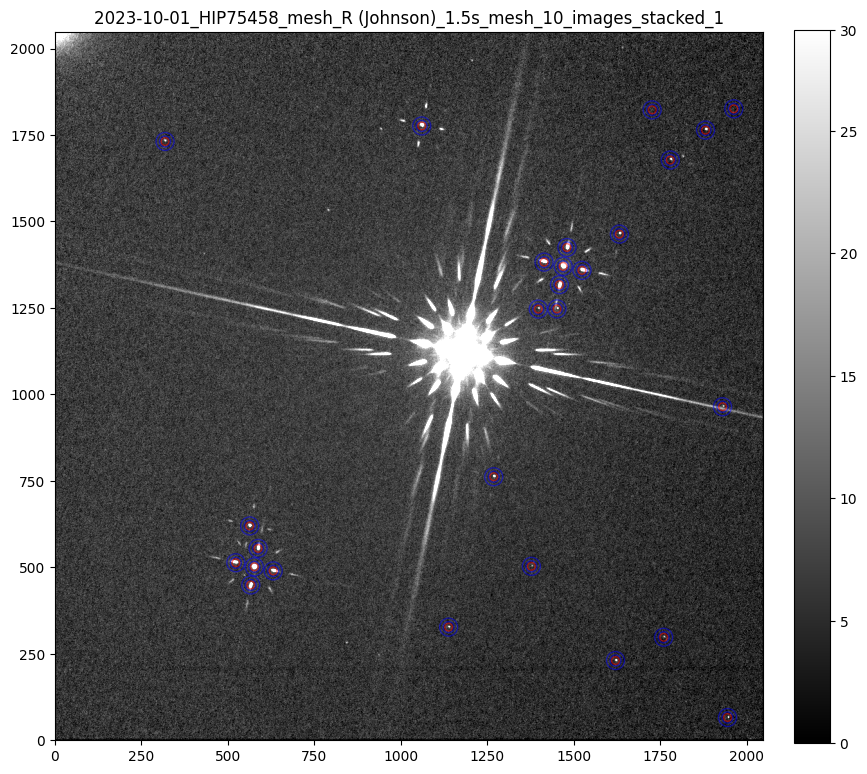

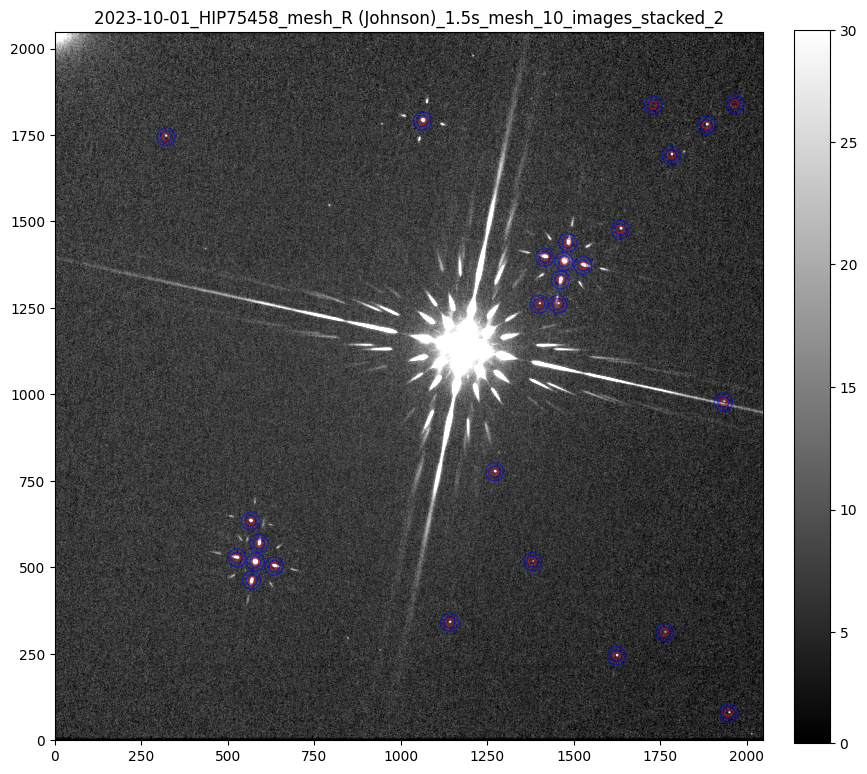

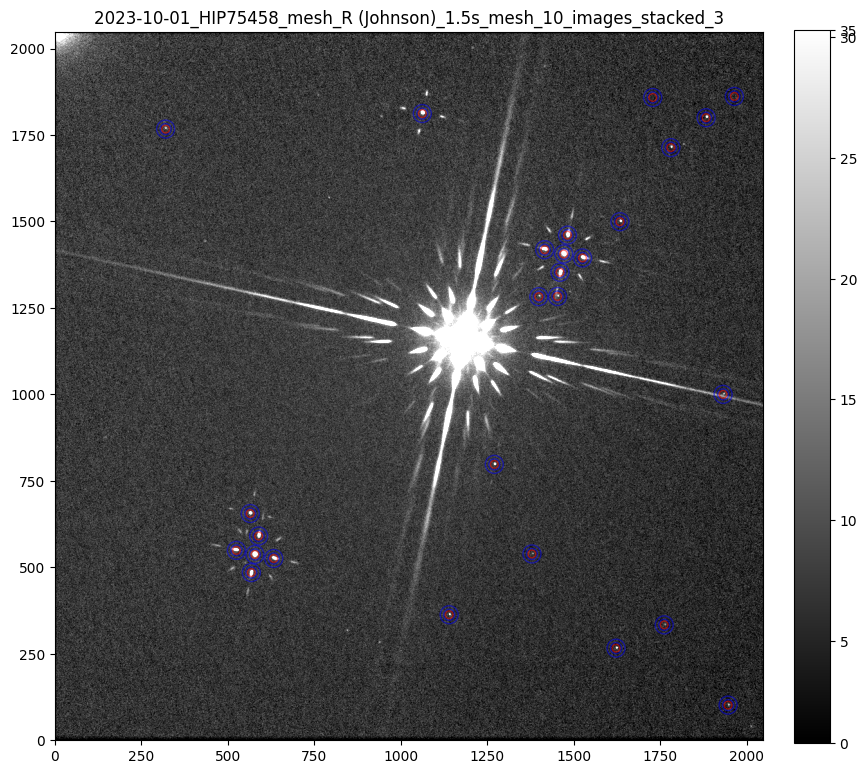

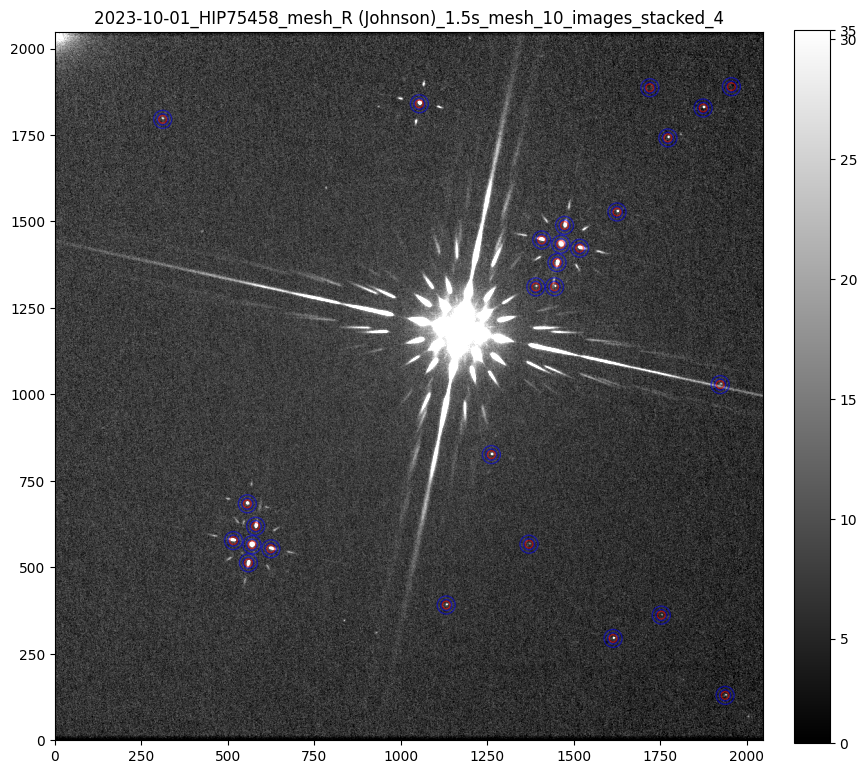

In [9]:
magnitude_list_faint = []
mask2 = np.zeros(image_list[0].shape, dtype=bool)

#mask middle
center = np.mean(bright_positions, axis=0) #determine center of bright star for masking
x, y = np.ogrid[:image_list[0].shape[1], :image_list[0].shape[0]]
circle_mask = np.sqrt((x - center[0]) ** 2 + (y - center[1]) ** 2) <= (270)
mask2[circle_mask] = True

#mask the spikes
def get_mask(triangle_corners):
    triangle_corners[:, [0, 1]] = triangle_corners[:, [1, 0]] #positions in y,x instead of x,y in programming
    y, x = np.ogrid[:image_list[0].shape[1], :image_list[0].shape[0]][::-1] #same here
    triangle_mask = ((x - triangle_corners[0, 0]) * (triangle_corners[1, 1] - triangle_corners[0, 1]) - (y - triangle_corners[0, 1]) * (triangle_corners[1, 0] - triangle_corners[0, 0]) > 0) & \
                    ((x - triangle_corners[1, 0]) * (triangle_corners[2, 1] - triangle_corners[1, 1]) - (y - triangle_corners[1, 1]) * (triangle_corners[2, 0] - triangle_corners[1, 0]) > 0) & \
                    ((x - triangle_corners[2, 0]) * (triangle_corners[0, 1] - triangle_corners[2, 1]) - (y - triangle_corners[2, 1]) * (triangle_corners[0, 0] - triangle_corners[2, 0]) > 0)
    return triangle_mask
for i in range (len(edge_list)):
    triangle_corners = np.array([edge_list[i], bright_positions[i], bright_positions[(i+1) % len(edge_list)]])
    triangle_mask = get_mask(triangle_corners)
    mask2[triangle_mask] = True


mean, median, std = sigma_clipped_stats(image_list[0], sigma=3.0)
daofind_faint = DAOStarFinder(fwhm=3.0, threshold=5.0*std, roundlo=-5.0, roundhi=5.0, brightest= 41) #roundlo and roundhi to adjust detection shape. need to be calibrated
sources_faint = daofind_faint(image_list[0], mask=mask2)
sources_faint.sort(['xcentroid', 'ycentroid'])
positions_faint = np.transpose((sources_faint['xcentroid'], sources_faint['ycentroid']))
print("unfiltered #stars:", len(positions_faint))
positions_faint,sources_faint = filter_sources(positions_faint, sources_faint, min_separation=40) #exclude multiple detections of star
print('detected stars in focused image:', len(positions_faint))
radius_faint = 11

for i,image in enumerate (image_list):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    show_image(image, fig=fig, ax=ax)
    ax.set_title(titles[i])
    shifted_positions = []
    for position in positions_faint:
        tuple = np.array((position[0]+shifts[i][0], position[1]+shifts[i][1]))
        shifted_positions.append(tuple)

    apertures_faint = [CircularAperture((x, y), r=radius_faint) for (x, y) in shifted_positions]
    annulus_apertures_faint = [CircularAnnulus((x,y),r_in=radius_faint+5, r_out=radius_faint+15) for (x,y) in shifted_positions]
    for aperture in apertures_faint:
        aperture.plot(color="red", lw=1.0, alpha=0.5)
    for anulus in annulus_apertures_faint:
        anulus.plot(color="blue", lw=1.0, alpha=0.5)

    phot_table_faint = Table(names=('id', 'xcenter', 'ycenter', 'aperture_sum', 'total_bkg'), dtype=('int', 'float', 'float', 'float', 'float'))
    for i in range(len(apertures_faint)):
        aperstats = ApertureStats(image, annulus_apertures_faint[i])
        bkg = aperstats.median
        aperture_area = apertures_faint[i].area_overlap(image)
        total_bkg = bkg * aperture_area
        phot_table = aperture_photometry(image, apertures_faint[i])
        phot_table['total_bkg'] = total_bkg
        phot_table_faint.add_row([i, phot_table['xcenter'][0], phot_table['ycenter'][0], phot_table['aperture_sum'][0], phot_table['total_bkg'][0]])

    magnitudes = []
    for row in phot_table_faint:
        magnitude = - (2.5 * np.log10(abs(row['aperture_sum'] - row['total_bkg']) / exptime))
        magnitudes.append(magnitude)
    magnitude_list_faint.append(magnitudes)
    phot_table_faint['magnitude'] = magnitudes

mean_magnitudes_list_faint = [np.mean(mag) for mag in magnitude_list_faint]
print(mean_magnitudes_list_faint)
print(np.mean(mean_magnitudes_list_faint), "+-",np.std(mean_magnitudes_list_faint))

# Diff Phot


In [10]:
diff_magnitude_list = []
for index in range (len(mean_magnitudes_list_faint)):
  diff_magnitude= mean_magnitude_list_bright[index] - mean_magnitudes_list_faint [index]
  #print(index,  mean_magnitude_list_bright[index] , mean_magnitudes_list_faint [index], diff_magnitude)
  diff_magnitude_list.append(diff_magnitude)

print(diff_magnitude_list)
print("The differential Magnitude of HIP100587 is: M = ", np.mean(diff_magnitude_list),"+-",np.std(diff_magnitude_list),"mag")
print(f"For bright star: {np.mean(mean_magnitude_list_bright)}+-{np.std(mean_magnitude_list_bright)}")
print(f"for faint stars: {np.mean(mean_magnitudes_list_faint)}+-{np.std(mean_magnitudes_list_faint)}")
print(round(np.mean(diff_magnitude_list),4), "err", round(np.std(diff_magnitude_list),4))
print(round(np.std(mean_magnitude_list_bright),4), ",", round(np.std(mean_magnitudes_list_faint),4))

[-2.6598043733998438, -2.705896522469194, -2.662316463988253, -2.7233165972210323, -2.6992184378943733]
The differential Magnitude of HIP100587 is: M =  -2.6901104789945394 +- 0.02500307052369009 mag
For bright star: -10.778539159927439+-0.008016855810401638
for faint stars: -8.0884286809329+-0.03101647343721461
-2.6901 err 0.025
0.008 , 0.031


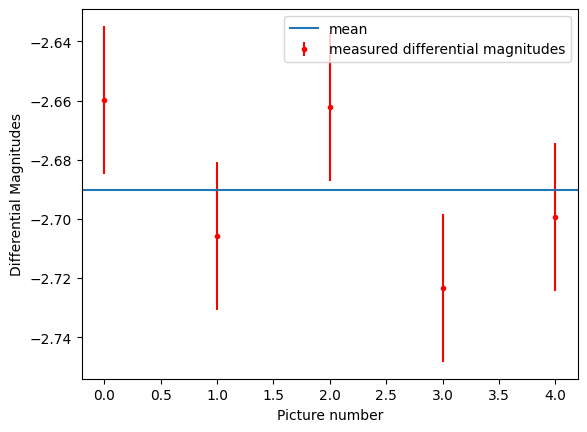

In [11]:
x= np.linspace(0,(len(diff_magnitude_list))-1, len(diff_magnitude_list))
plt.errorbar(x, diff_magnitude_list, yerr= np.std(diff_magnitude_list), linestyle = "None", marker = ".",color="r", label = "measured differential magnitudes")
plt.axhline(np.mean(diff_magnitude_list), label= "mean" )
plt.xlabel("Picture number")
plt.ylabel("Differential Magnitudes")
plt.legend()

# Save positons



In [18]:
import datetime
output_path = "/home/finn/visual_Studio_Code/bachelorarbeit/"
current_date = datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S")

def write_data_to_text_file(bright_positions, theta_list, edge_list, output_filename, image_path):
    os.makedirs(output_path, exist_ok=True)
    #output_path = os.path.join(path, output_filename)
    with open(os.path.join(output_path, output_filename), 'a') as file:
        file.write("Date: " + current_date + "\n")
        file.write("path to file =" + str(image_path)+ "\n")
        file.write("bright_positions = " + str(bright_positions) + "\n")
        file.write("theta_list = " + str(theta_list) + "\n")
        file.write("edge_list = " + str(edge_list) + "\n")
        file.write("calc diff mag =" + str(np.mean(mean_magnitude_list_bright)) + "+-" + str(np.std(mean_magnitude_list_bright)) + "\n")
        file.write("\n")

write_data_to_text_file(bright_positions, theta_list, edge_list, "all_used_positions_mesh.txt", path)


# Plot all together (for fun)


In [ ]:
for i,image in enumerate (image_list):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    show_image(image, fig=fig, ax=ax)
    ax.set_title(titles[i])
    shifted_positions = []
    for position in positions_faint:
        tuple = np.array((position[0]+shifts[i][0], position[1]+shifts[i][1]))
        shifted_positions.append(tuple)

    apertures_faint = [CircularAperture((x, y), r=radius_faint) for (x, y) in shifted_positions]
    annulus_apertures_faint = [CircularAnnulus((x,y),r_in=radius_faint+5, r_out=radius_faint+15) for (x,y) in shifted_positions]
    for aperture in apertures_faint:
        aperture.plot(color="red", lw=1.0, alpha=0.5)
    for anulus in annulus_apertures_faint:
        anulus.plot(color="blue", lw=1.0, alpha=0.5)

    shifted_positions = []
    for position in bright_positions:
        tuple = np.array((position[0]+shifts[i][0], position[1]+shifts[i][1]))
        shifted_positions.append(tuple)

    apertures_bright = [RectangularAperture(position, w=w, h=h, theta=theta) for position, theta in zip(shifted_positions, theta_list)]
    annuluses_bright = [RectangularAnnulus(position, w_in=w+5, w_out=w+15, h_in=h+5, h_out=h+15, theta=theta) for position, theta in zip(shifted_positions, theta_list)]
    for aperture in apertures_bright:
        aperture.plot(color="green", lw=1.0, alpha=0.5)
    for anulus in annuluses_bright:
        anulus.plot(color="purple", lw=1.0, alpha=0.5)

Output hidden; open in https://colab.research.google.com to view.